In [172]:
try:
    ib.disconnect()
except:
    pass

# Import Libraries

In [173]:
from ib_insync import *
import os
import pandas as pd
from datetime import datetime, timedelta
import time
import numpy as np

In [174]:
util.startLoop()

In [175]:
ib = IB()
ib.connect('127.0.0.1', 7497, clientId=1)

<IB connected to 127.0.0.1:7497 clientId=1>

In [5]:
tickers = ["TSLA", "META", "MSFT", "ORCL", "AAPL", "CSCO", "KO", "CRM", "CDNA", "UPWK"]
index = ["SPX"]

## Helper Functions

In [55]:
def loadDataIBKR(ib: IB, symbol: str, endDateTime: str, durationStr: str, barSizeSetting: str, whatToShow: str, useRTH: bool, formatDate: int, keepUpToDate: bool, 
                 output_path: str, secType: str = 'STK', exchange: str = 'SMART', currency: str = 'USD') -> pd.DataFrame:
    
    """
    Load historical data from Interactive Brokers API and save it to a CSV file.

    Parameters:
        ib (Client): Interactive Brokers API client object.
        symbol (str): Symbol of the instrument.
        endDateTime (str): End date and time for the data request (format: 'YYYYMMDD HH:MM:SS').
        durationStr (str): Duration for the data request (e.g., '900 S' for 900 seconds).
        barSizeSetting (str): Bar size setting for the data request (e.g., '5 secs').
        whatToShow (str): Type of data to retrieve (e.g., 'TRADES').
        useRTH (bool): Whether to use regular trading hours only (True or False).
        formatDate (int): Format date (e.g., 1 for 'yyyymmdd{space}{hh:mm:ss}').
        keepUpToDate (bool): Whether to keep the request up to date (True or False).
        output_path (str): Path to save the output CSV file.
        secType (str, optional): Security type (default is 'STK').
        exchange (str, optional): Exchange (default is 'SMART').
        currency (str, optional): Currency (default is 'USD').

    Returns:
        pd.DataFrame: DataFrame containing the historical data.
    """

    output_path = output_path + f"/{barSizeSetting.replace(' ', '')}"
    if not os.path.exists(output_path):
        os.makedirs(output_path)
    contract = Contract(symbol=symbol, secType=secType, exchange=exchange, currency=currency)
    bars = ib.reqHistoricalData(
            contract,
            endDateTime=endDateTime, #'20240315 09:15:00 US/Eastern'
            durationStr=durationStr, #'900 S'
            barSizeSetting=barSizeSetting, #'5 secs'
            whatToShow=whatToShow, #'TRADES'
            useRTH=useRTH, #True
            formatDate=formatDate, #1
            keepUpToDate=keepUpToDate #True
            )
    
    data = util.df(bars)

    # If the file already exists, append the new data to the old data

    if(os.path.exists(output_path + f"/{symbol}" + ".csv")):
        old_data = pd.read_csv(output_path + f"/{symbol}" + ".csv", index_col=0)
        data = pd.concat([old_data, data], axis=0)
        data['date'] = pd.to_datetime(data['date'])
        
        data = data.drop_duplicates(subset='date', keep='first')
        data = data.sort_values(by='date', ascending=True).reset_index(drop=True)

    data.to_csv(output_path + f"/{symbol}" + ".csv")
    return data

# Loading Data

In [159]:
def loadDataUtil(tickers: list, delta: int, secType: str = 'STK', exchange: str = 'SMART') -> None:

    for ticker in tickers:

        for delta in range(7,0,-1):
            today = (datetime.now() - timedelta(days=delta)).strftime("%Y%m%d")
            print(ticker, delta)

            tz = "US/Eastern"
            if(secType == 'IND'):
                tz = "US/Central"
            loadDataIBKR(ib, ticker, f'{today} 16:00:00 {tz}', '23400 S', '5 secs', 'TRADES', True, 1, False, "data", secType=secType, exchange=exchange)
            ib.sleep(0.5)

            print("--------------DONE-----------------")

loadDataUtil([], 7)

In [218]:
def prepare_df():

    main_df = pd.DataFrame()

    for ticker in tickers + index:

        data = pd.read_csv(f"data/5secs/{ticker}.csv", index_col=0)
        data['date'] = pd.to_datetime(data['date']).dt.tz_convert('US/Eastern')
        data.set_index('date', inplace=True)

        data.rename(columns={'open': f'{ticker}_open', 'high': f'{ticker}_high', 'low': f'{ticker}_low', 'close': f'{ticker}_close', 'volume': f'{ticker}_volume'}, inplace=True)
        
        data[f"{ticker}_log_return"] = np.log(data[f'{ticker}_close'] / data[f'{ticker}_close'].shift(1))
        data[f"{ticker}_returns"] = data[f'{ticker}_close'].pct_change(1)

        data[f"{ticker}_log_return_lag_12"] = np.log(data[f'{ticker}_close'] / data[f'{ticker}_close'].shift(12))
        data[f"{ticker}_log_return_lag_24"] = np.log(data[f'{ticker}_close'] / data[f'{ticker}_close'].shift(24))
        data[f"{ticker}_log_return_lag_36"] = np.log(data[f'{ticker}_close'] / data[f'{ticker}_close'].shift(36))

        data[f"{ticker}_returns_lag_12"] = data[f'{ticker}_close'].pct_change(12)
        data[f"{ticker}_returns_lag_24"] = data[f'{ticker}_close'].pct_change(24)
        data[f"{ticker}_returns_lag_36"] = data[f'{ticker}_close'].pct_change(36)

        data[f"{ticker}_high_36"] = data[f'{ticker}_close'].rolling(window=36).max()
        data[f"{ticker}_low_36"] = data[f'{ticker}_close'].rolling(window=36).min()

        data = data[[f'{ticker}_close', f"{ticker}_high_36", f"{ticker}_low_36", \
                    f"{ticker}_returns", f"{ticker}_returns_lag_12",\
                    f"{ticker}_returns_lag_24", f"{ticker}_returns_lag_36",\
                        f"{ticker}_log_return", f"{ticker}_log_return_lag_12",\
                                f"{ticker}_log_return_lag_24", f"{ticker}_log_return_lag_36",\
                            f'{ticker}_volume']]
        # data = data.shift(-36).iloc[:-36]
        main_df = pd.concat([main_df, data], axis=1).dropna()
    
    # print(main_df)
    dates = list(set(main_df.index.date.astype(str).tolist()))
    
    return main_df, dates
    

In [219]:
main_df, dates = prepare_df()

In [220]:
main_df

,TSLA_close,TSLA_high_36,TSLA_low_36,TSLA_returns,TSLA_returns_lag_12,TSLA_returns_lag_24,TSLA_returns_lag_36,TSLA_log_return,TSLA_log_return_lag_12,TSLA_log_return_lag_24,...,SPX_low_36,SPX_returns,SPX_returns_lag_12,SPX_returns_lag_24,SPX_returns_lag_36,SPX_log_return,SPX_log_return_lag_12,SPX_log_return_lag_24,SPX_log_return_lag_36,SPX_volume
date,,,,,,,,,,,,,,,,,,,,,
2024-03-13 09:33:00-04:00,175.86,175.86,172.80,0.002394,0.014596,0.013544,0.014655,0.002391,0.014491,0.013453,...,5172.10,0.000145,0.000186,-0.000081,-0.000384,0.000145,0.000186,-0.000081,-0.000385,0.0
2024-03-13 09:33:05-04:00,175.82,175.86,172.80,-0.000227,0.015420,0.014658,0.013898,-0.000227,0.015302,0.014552,...,5172.10,0.000029,0.000338,-0.000108,-0.000214,0.000029,0.000338,-0.000108,-0.000215,0.0
2024-03-13 09:33:10-04:00,176.00,176.00,172.80,0.001024,0.016636,0.014819,0.015580,0.001023,0.016499,0.014710,...,5172.10,0.000143,0.000528,0.000044,0.000046,0.000143,0.000528,0.000044,0.000046,0.0
2024-03-13 09:33:15-04:00,175.85,176.00,172.80,-0.000852,0.011853,0.014949,0.013954,-0.000853,0.011784,0.014838,...,5172.10,-0.000050,0.000284,0.000019,-0.000158,-0.000050,0.000284,0.000019,-0.000158,0.0
2024-03-13 09:33:20-04:00,175.67,176.00,172.80,-0.001024,0.009598,0.015434,0.011167,-0.001024,0.009552,0.015316,...,5172.10,0.000060,0.000184,0.000021,-0.000062,0.000060,0.000184,0.000021,-0.000062,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-19 15:59:35-04:00,171.40,171.59,171.31,0.000058,-0.000933,-0.000816,-0.000874,0.000058,-0.000933,-0.000816,...,5176.15,0.000004,-0.000523,-0.000400,-0.000450,0.000004,-0.000523,-0.000400,-0.000450,0.0
2024-03-19 15:59:40-04:00,171.48,171.59,171.31,0.000467,-0.000525,-0.000408,-0.000583,0.000467,-0.000525,-0.000408,...,5176.15,0.000199,-0.000324,-0.000139,-0.000297,0.000199,-0.000324,-0.000139,-0.000297,0.0
2024-03-19 15:59:45-04:00,171.38,171.59,171.31,-0.000583,-0.001107,-0.001166,-0.000874,-0.000583,-0.001108,-0.001166,...,5176.15,-0.000199,-0.000504,-0.000382,-0.000380,-0.000199,-0.000504,-0.000382,-0.000380,0.0


<Figure size 1500x1500 with 0 Axes>

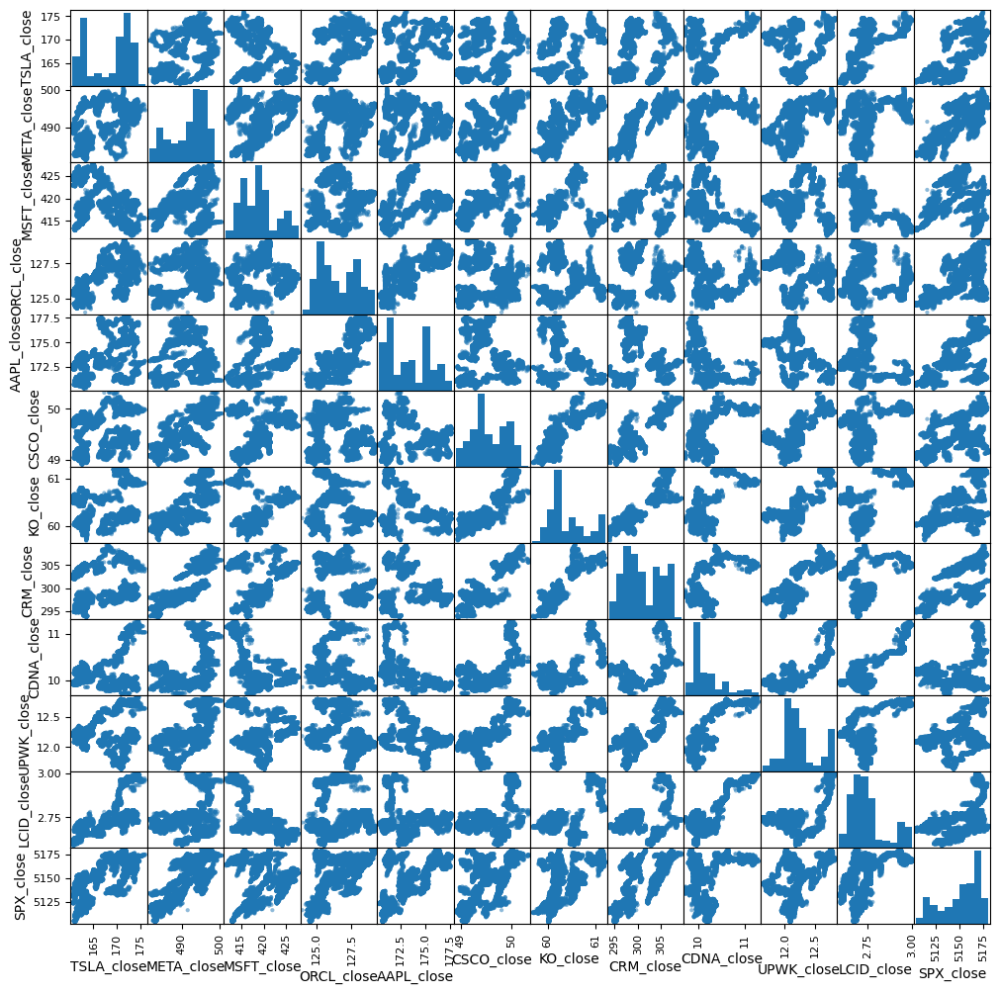

In [121]:
# plot correlation graph between close prices

import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix

plt.figure(figsize=(15,15))
scatter_matrix(main_df[[ticker + "_close" for ticker in tickers+index]],figsize=(12,12))
plt.show()

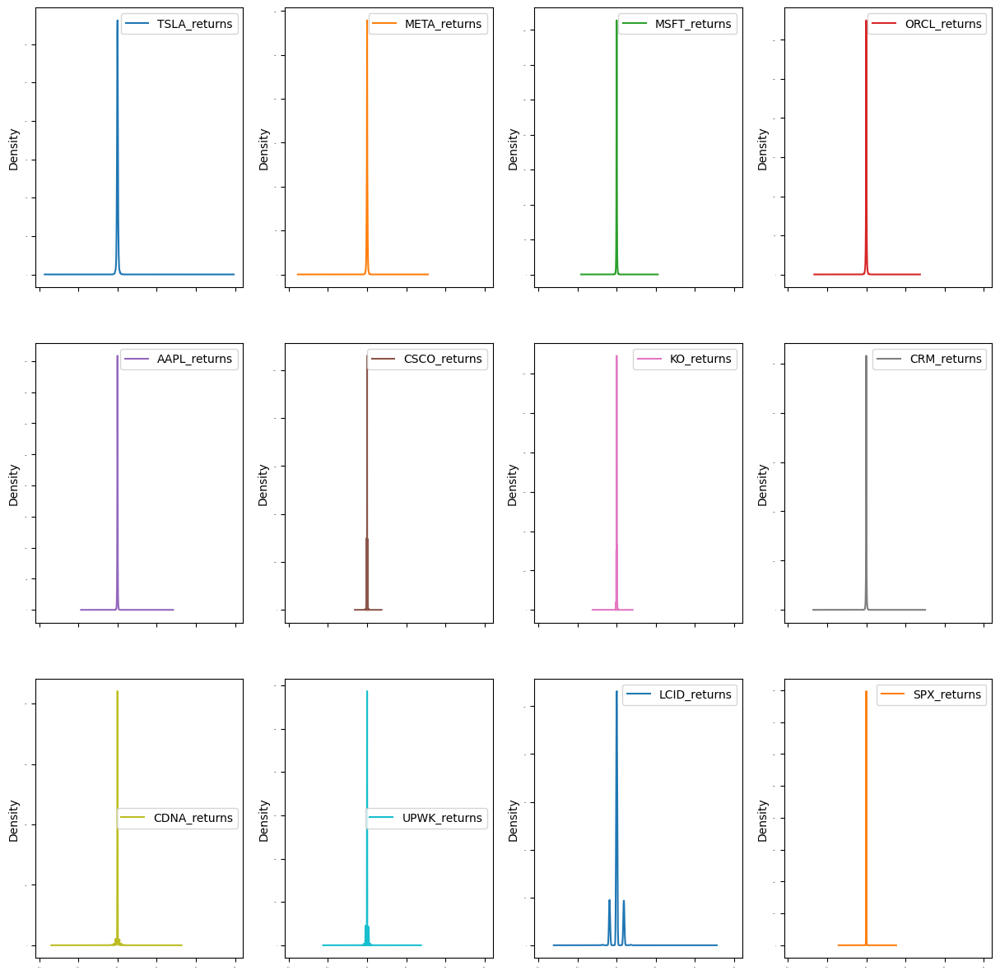

In [122]:
# plot log returns

main_df[[ticker + "_returns" for ticker in tickers+index]].plot(kind='density', subplots=True, layout=(3,4), sharex=True, legend=True, fontsize=1, figsize=(15,15))
plt.show()

In [123]:
main_df

,TSLA_close,TSLA_returns,TSLA_log_return,TSLA_volume,META_close,META_returns,META_log_return,META_volume,MSFT_close,MSFT_returns,...,UPWK_log_return,UPWK_volume,LCID_close,LCID_returns,LCID_log_return,LCID_volume,SPX_close,SPX_returns,SPX_log_return,SPX_volume
date,,,,,,,,,,,,,,,,,,,,,
2024-03-13 09:30:05-04:00,173.41,0.000519,0.000519,557.70,495.70,0.000363,0.000363,47.31,416.78,-0.001557,...,0.000000,8.41,2.91,0.013937,0.013841,542.00,5175.20,-0.000141,-0.000141,0.0
2024-03-13 09:30:10-04:00,173.30,-0.000634,-0.000635,357.77,495.10,-0.001210,-0.001211,71.30,416.38,-0.000960,...,-0.000799,1.00,2.91,0.000000,0.000000,24.66,5174.59,-0.000118,-0.000118,0.0
2024-03-13 09:30:15-04:00,173.43,0.000750,0.000750,794.15,494.95,-0.000303,-0.000303,177.88,416.69,0.000745,...,0.000000,1.00,2.90,-0.003436,-0.003442,2.57,5175.39,0.000155,0.000155,0.0
2024-03-13 09:30:20-04:00,173.73,0.001730,0.001728,200.61,495.51,0.001131,0.001131,44.22,416.30,-0.000936,...,0.003192,4.00,2.90,0.000000,0.000000,0.00,5175.20,-0.000037,-0.000037,0.0
2024-03-13 09:30:25-04:00,173.73,0.000000,0.000000,235.66,495.70,0.000383,0.000383,23.09,416.23,-0.000168,...,-0.000797,3.62,2.91,0.003448,0.003442,195.36,5175.33,0.000025,0.000025,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-19 15:59:35-04:00,171.40,0.000058,0.000058,155.31,496.24,0.000262,0.000262,84.40,421.40,0.000309,...,0.000000,47.90,2.70,0.000000,0.000000,200.15,5177.42,0.000004,0.000004,0.0
2024-03-19 15:59:40-04:00,171.48,0.000467,0.000467,277.75,496.17,-0.000141,-0.000141,141.76,421.40,0.000000,...,0.000833,33.09,2.70,0.000000,0.000000,432.65,5178.45,0.000199,0.000199,0.0
2024-03-19 15:59:45-04:00,171.38,-0.000583,-0.000583,337.79,496.22,0.000101,0.000101,183.64,421.18,-0.000522,...,-0.000833,47.85,2.70,0.000000,0.000000,356.13,5177.42,-0.000199,-0.000199,0.0


In [124]:
returns_df = main_df[[ticker + "_returns" for ticker in tickers+index]]
log_returns_df = main_df[[ticker + "_log_return" for ticker in tickers+index]]
close_df = main_df[[ticker + "_close" for ticker in tickers+index]]
volume_df = main_df[[ticker + "_volume" for ticker in tickers]]

In [125]:
# scale every df

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_returns = scaler.fit_transform(returns_df)
scaled_log_returns = scaler.fit_transform(log_returns_df)
scaled_close = scaler.fit_transform(close_df)
scaled_volume = scaler.fit_transform(volume_df)

scaled_returns_df = pd.DataFrame(scaled_returns, columns=[ticker + "_returns" for ticker in tickers+index], index=returns_df.index)
scaled_log_returns_df = pd.DataFrame(scaled_log_returns, columns=[ticker + "_log_return" for ticker in tickers+index], index=log_returns_df.index)
scaled_close_df = pd.DataFrame(scaled_close, columns=[ticker + "_close" for ticker in tickers+index], index=close_df.index)
scaled_volume_df = pd.DataFrame(scaled_volume, columns=[ticker + "_volume" for ticker in tickers], index=volume_df.index)


array([[<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>],
       [<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>],
       [<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>]], dtype=object)

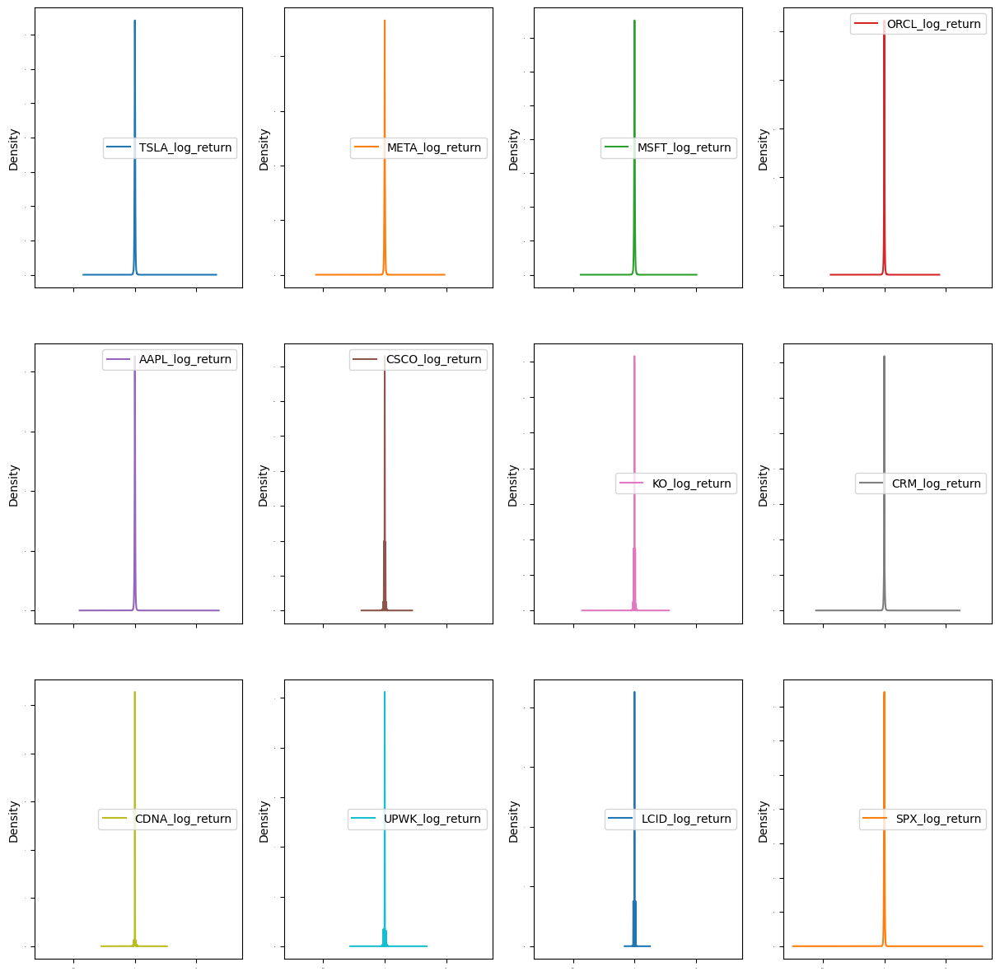

In [126]:
# plot scaled log returns

scaled_log_returns_df.plot(kind='density', subplots=True, layout=(3,4), sharex=True, legend=True, fontsize=1, figsize=(15,15))

array([[<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>],
       [<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>],
       [<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>]], dtype=object)

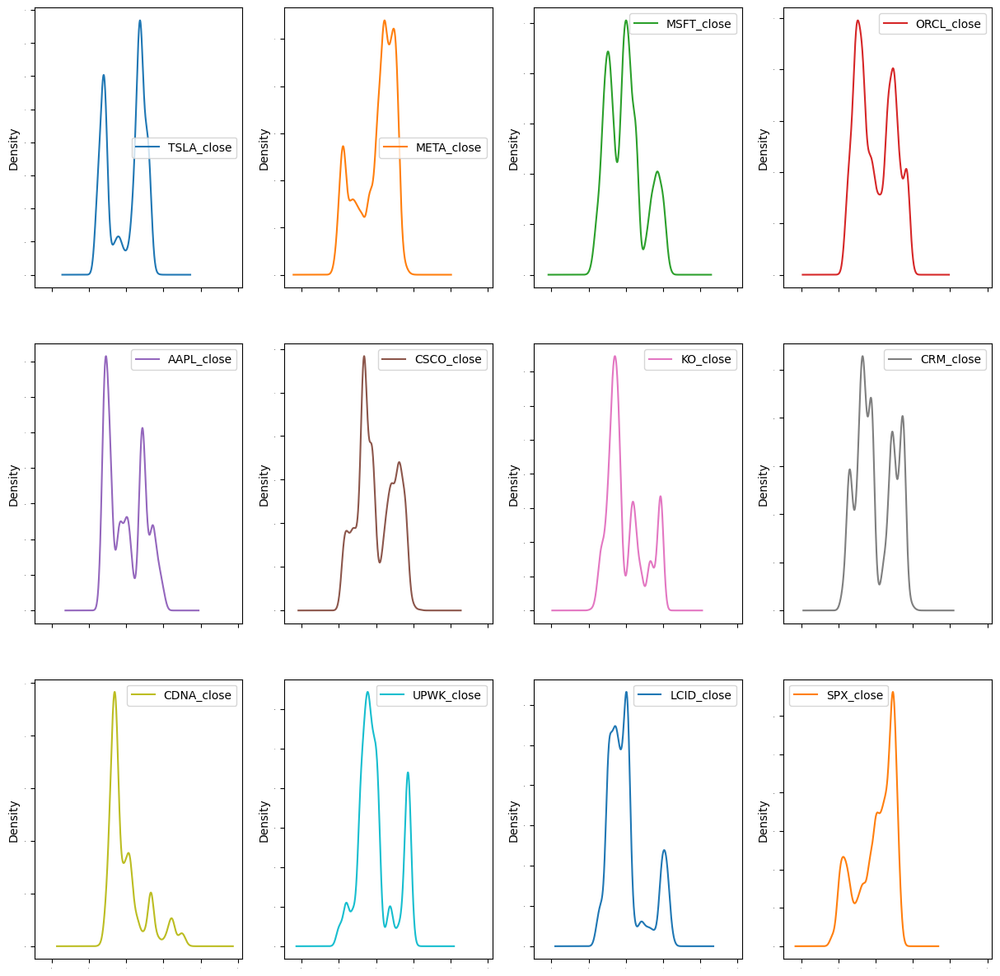

In [127]:
# plot scaled close prices

scaled_close_df.plot(kind='density', subplots=True, layout=(3,4), sharex=True, legend=True, fontsize=1, figsize=(15,15))

array([[<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>],
       [<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>],
       [<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>]], dtype=object)

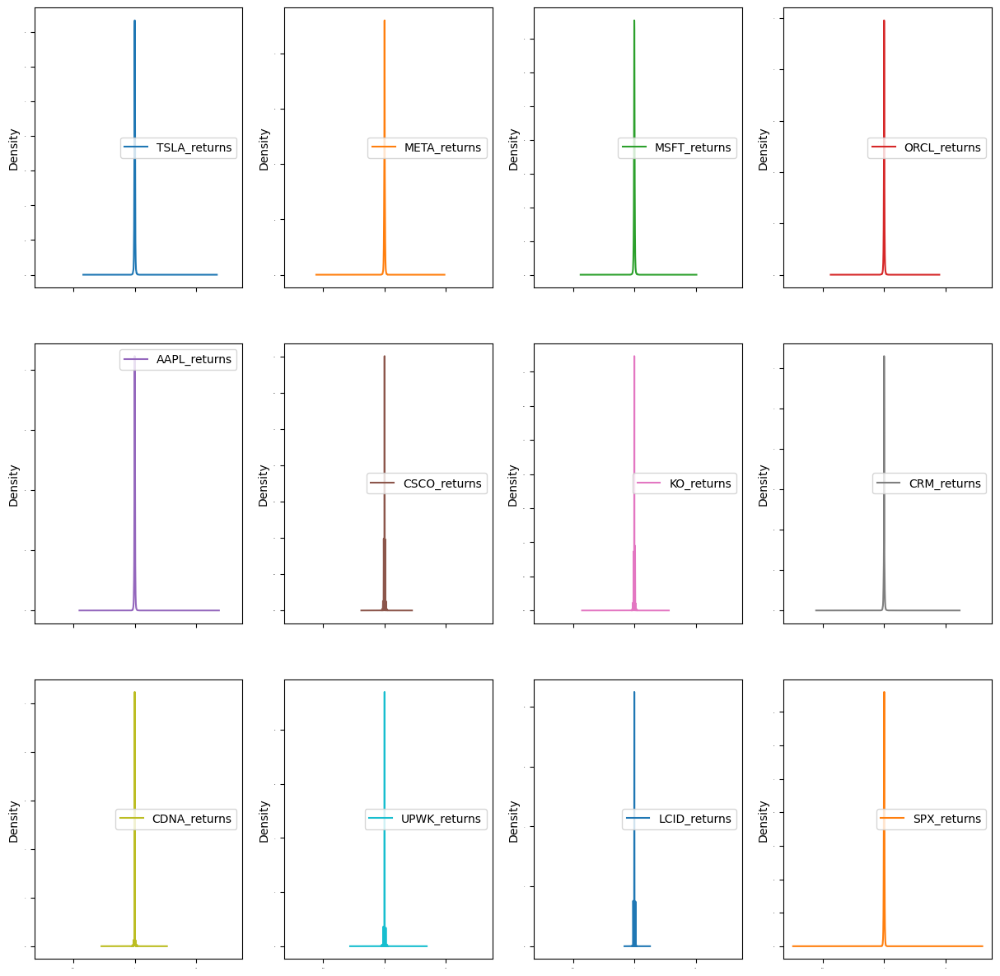

In [128]:
scaled_returns_df.plot(kind='density', subplots=True, layout=(3,4), sharex=True, legend=True, fontsize=1, figsize=(15,15))

<Figure size 1500x1500 with 0 Axes>

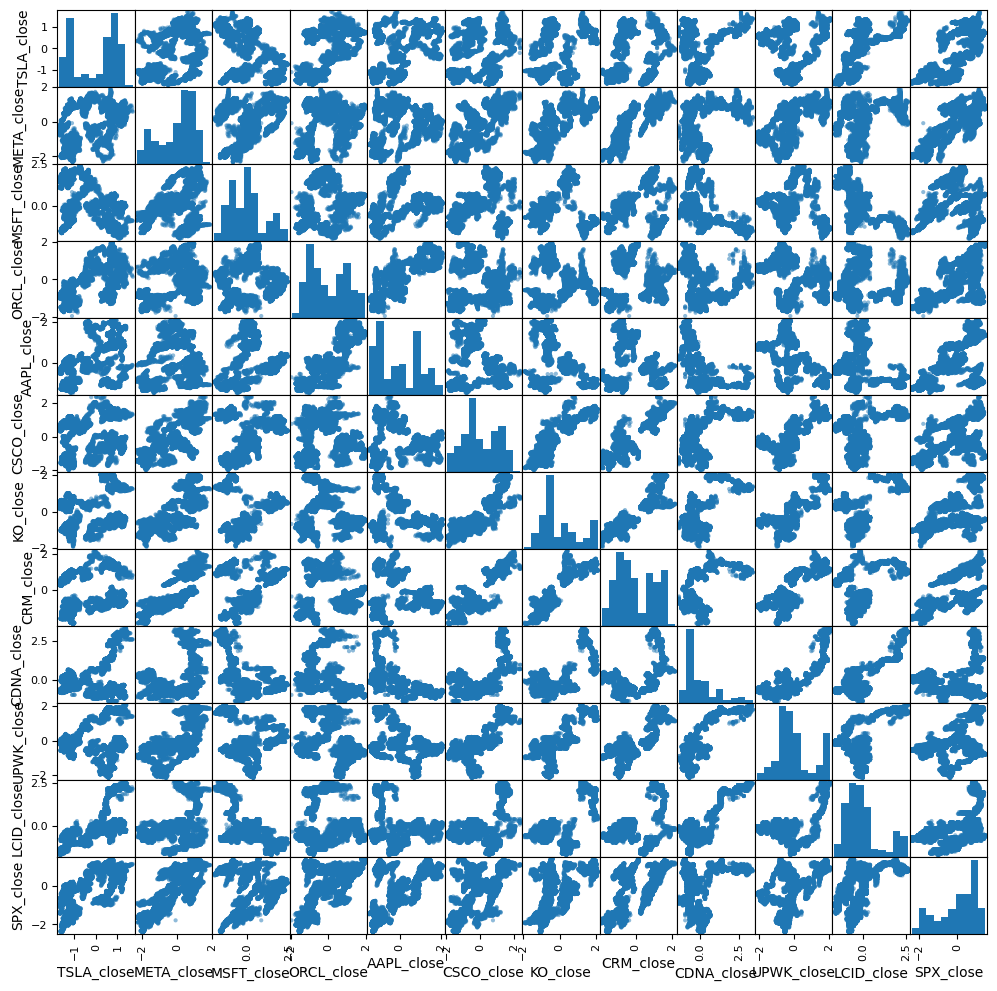

In [129]:
# plot correlation graph between close prices

plt.figure(figsize=(15,15))
scatter_matrix(scaled_close_df,figsize=(12,12))
plt.show()

<Figure size 1500x1500 with 0 Axes>

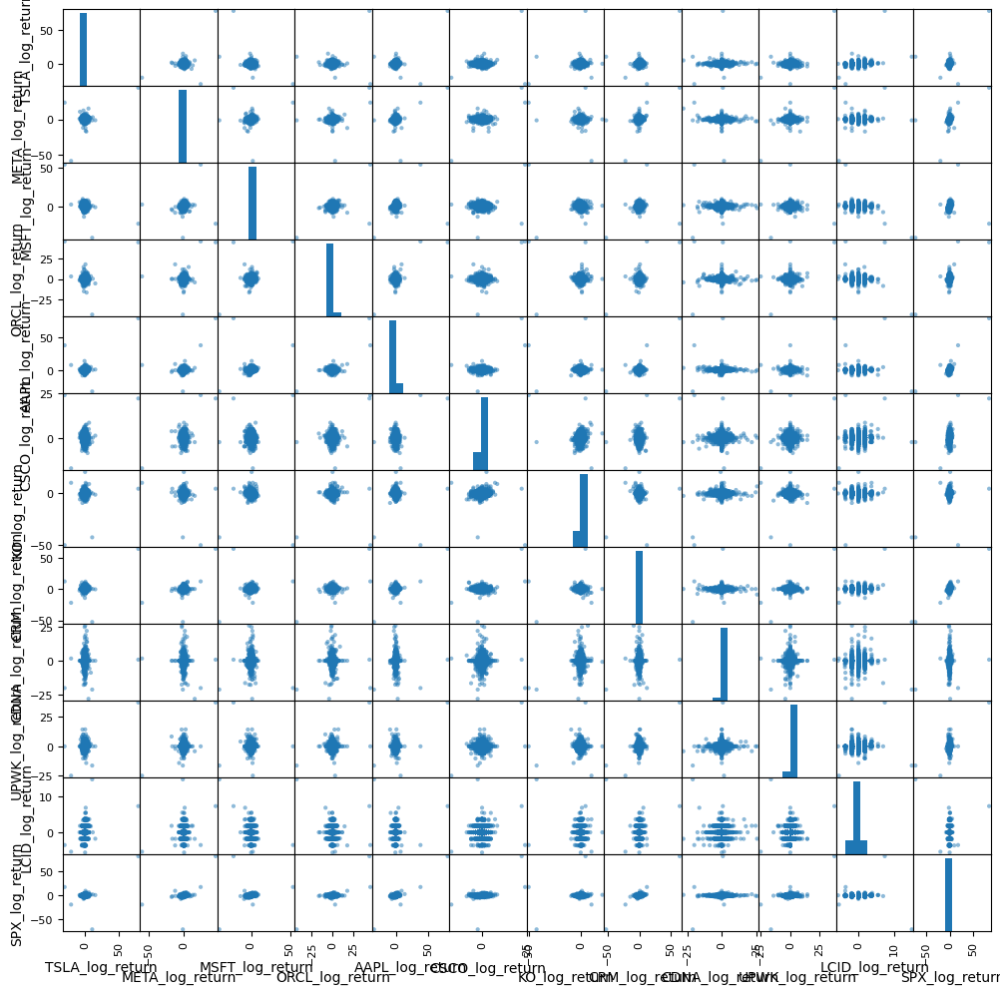

In [130]:
# plot correlation graph between log returns

plt.figure(figsize=(15,15))
scatter_matrix(scaled_log_returns_df,figsize=(12,12))
plt.show()

<Figure size 1500x1500 with 0 Axes>

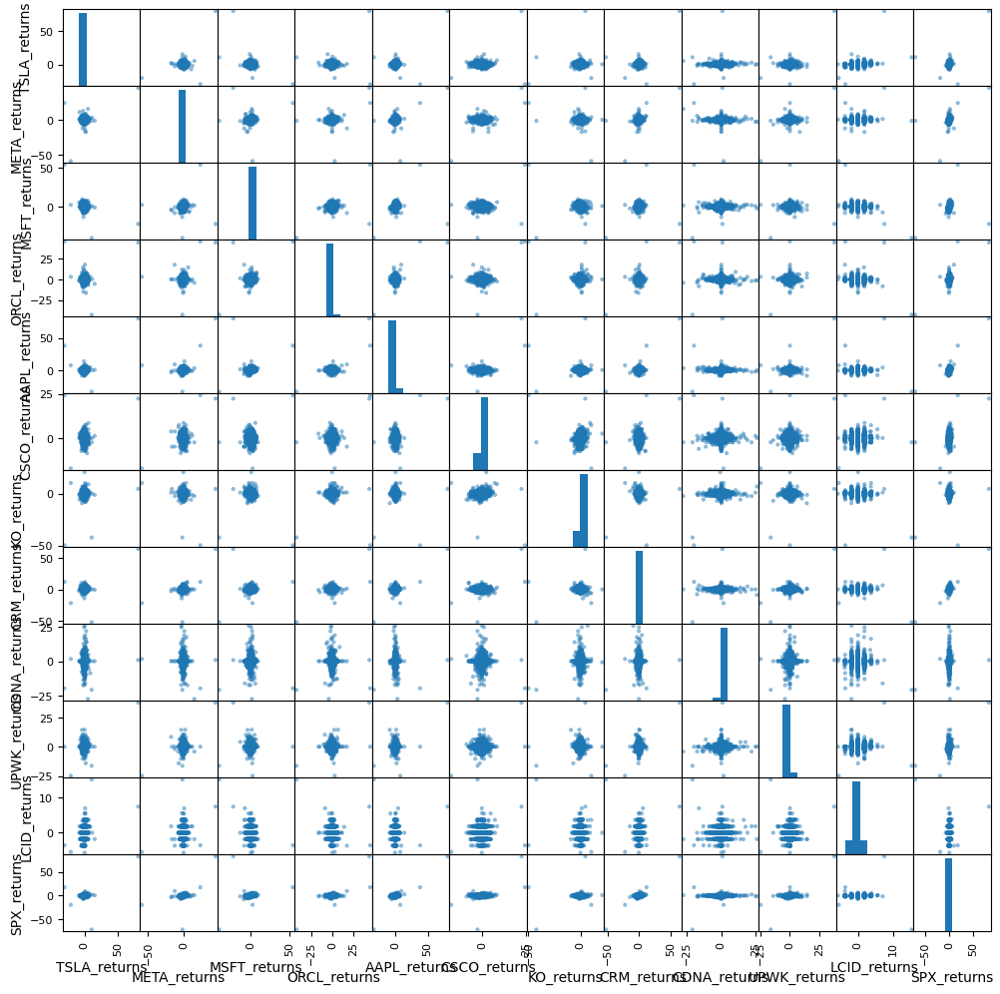

In [131]:
# plot correlation graph between returns

plt.figure(figsize=(15,15))
scatter_matrix(scaled_returns_df,figsize=(12,12))
plt.show()

<Figure size 1500x1500 with 0 Axes>

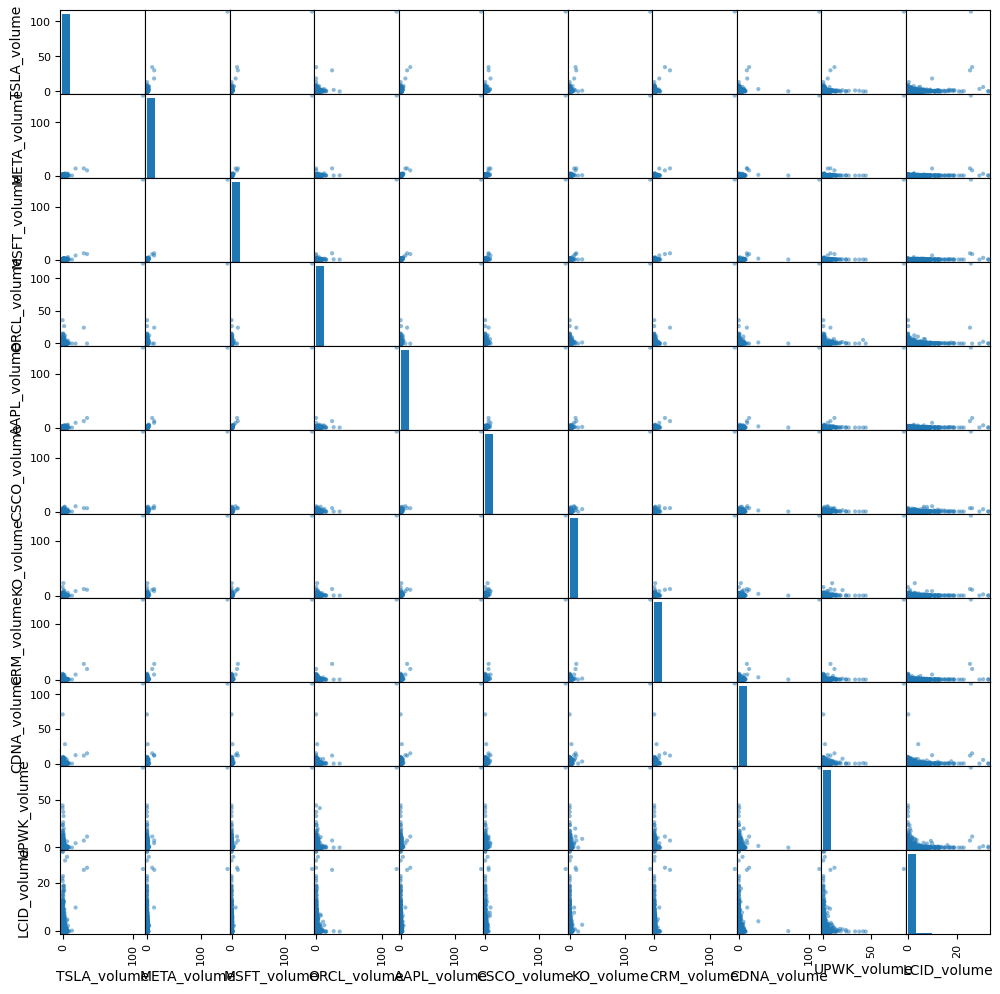

In [132]:
# plot correlation graph between volume and remove spx volume

plt.figure(figsize=(15,15))
scatter_matrix(scaled_volume_df,figsize=(12,12))
plt.show()

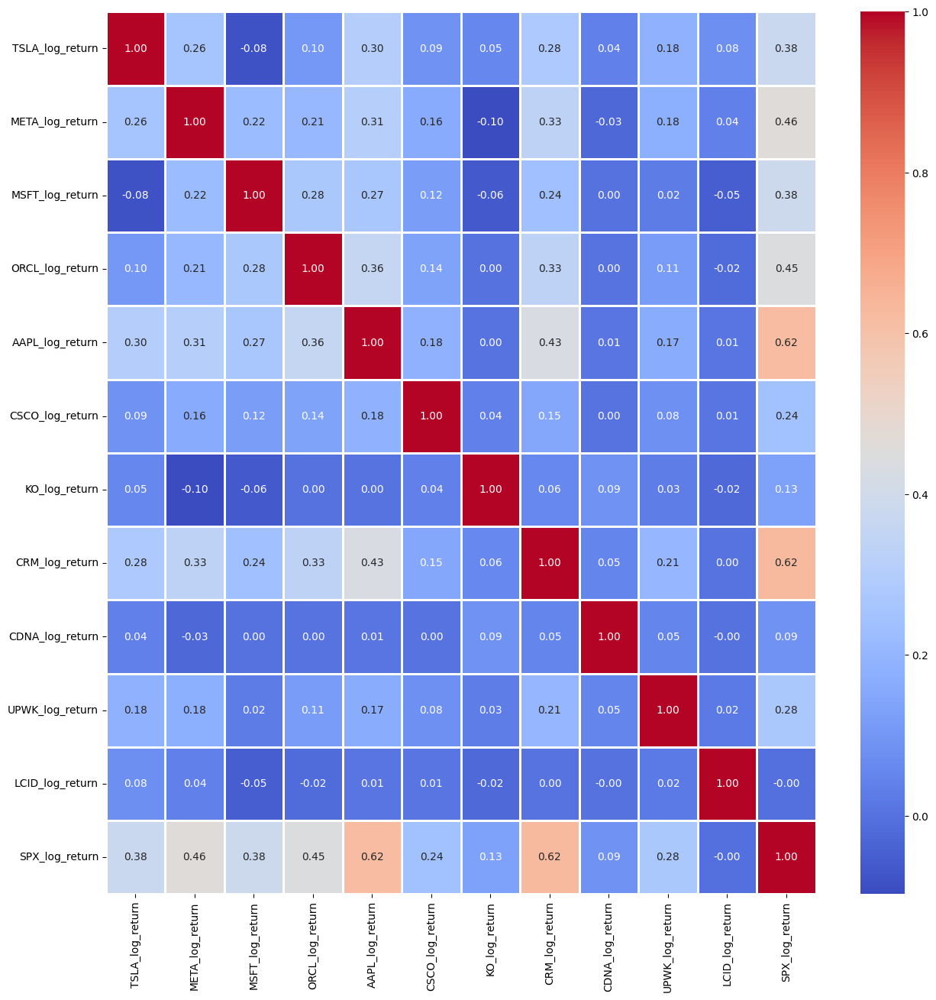

In [133]:
# plot correlation matrix

import seaborn as sns

plt.figure(figsize=(15,15))
sns.heatmap(scaled_log_returns_df.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=2)
plt.show()

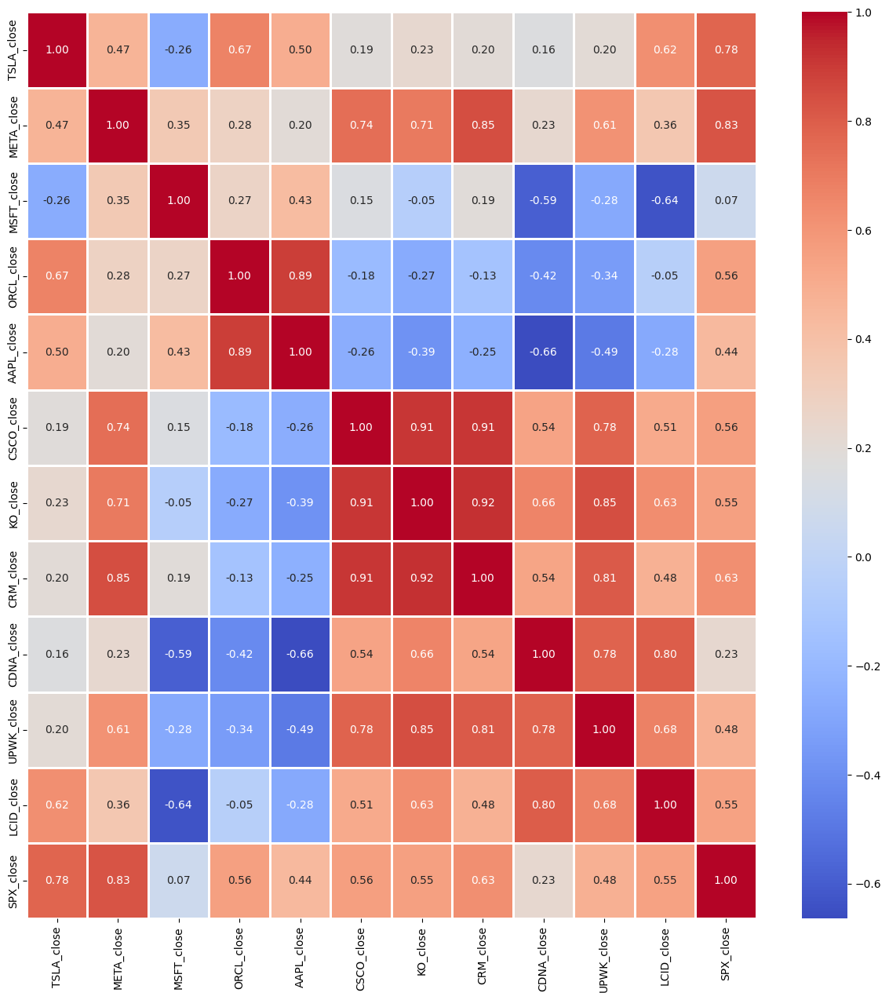

In [134]:
# plot correlation matrix for close prices

plt.figure(figsize=(15,15))
sns.heatmap(scaled_close_df.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=2)
plt.show()

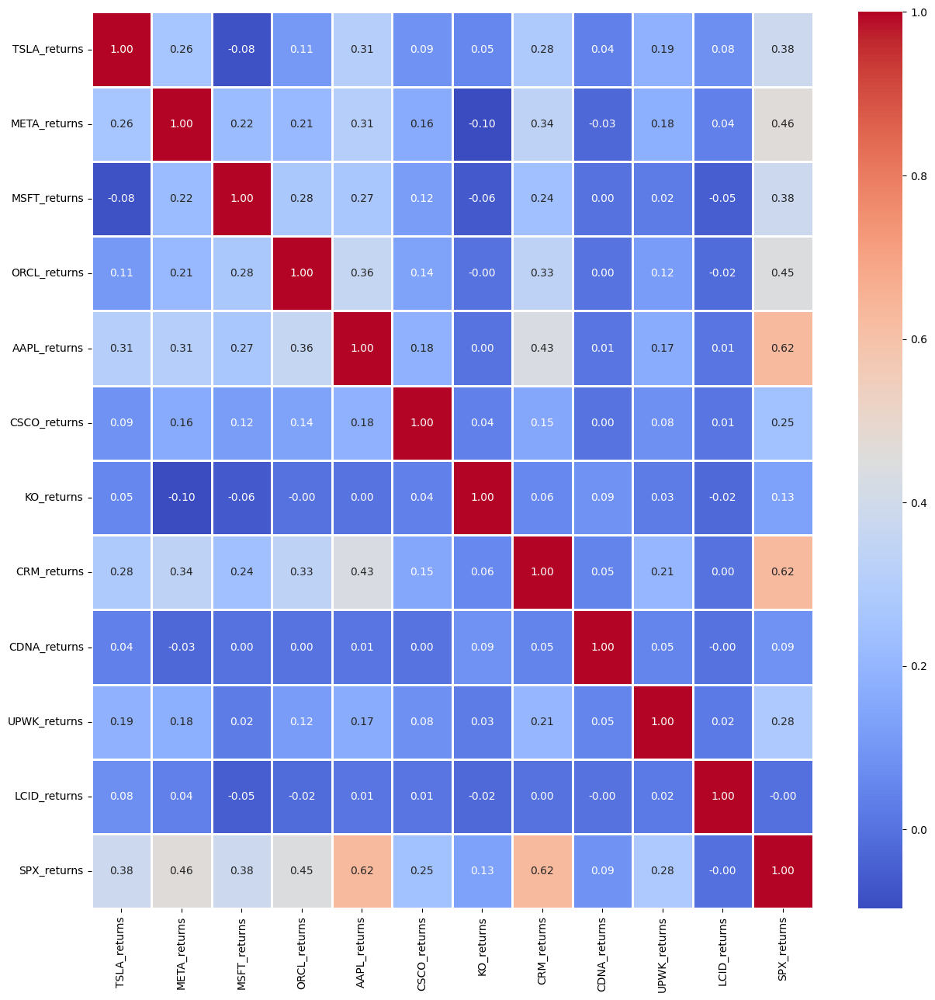

In [135]:
# plot correlation matrix for returns

plt.figure(figsize=(15,15))
sns.heatmap(scaled_returns_df.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=2)
plt.show()

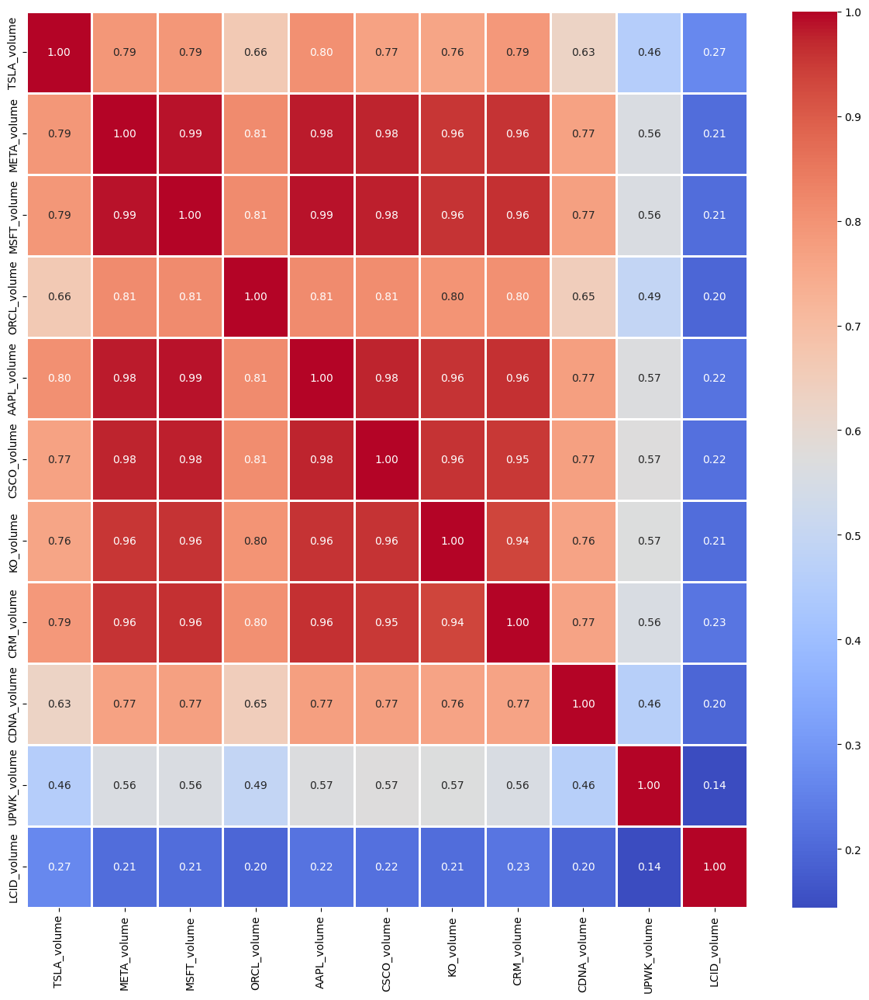

In [136]:
# plot correlation matrix for volume

plt.figure(figsize=(15,15))
sns.heatmap(scaled_volume_df.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=2)
plt.show()

In [170]:
# plot day-wise returns

main_df["dateOnly"] = main_df.index.date.astype(str)

<Axes: xlabel='date'>

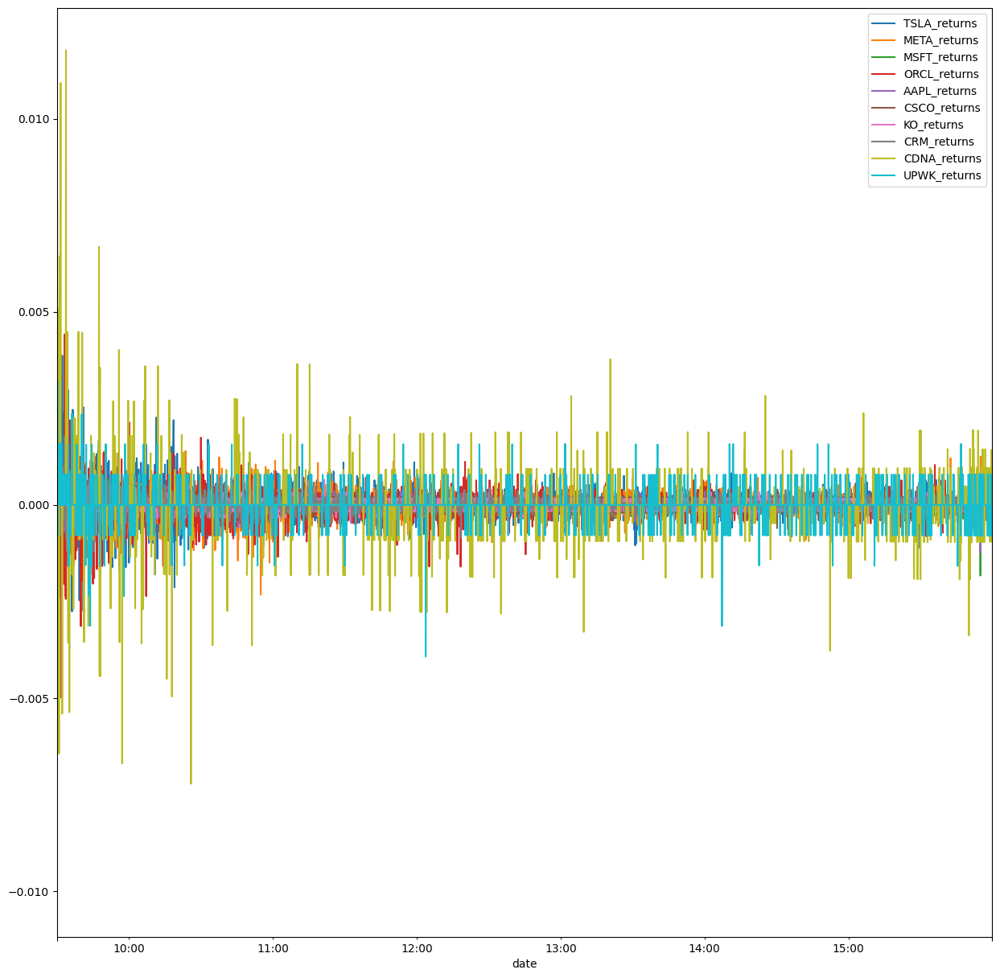

In [171]:
main_df[main_df.index.date.astype(str)=="2024-03-13"][[ticker + "_returns" for ticker in tickers]].plot(figsize=(15,15))

In [9]:
# use plotly to plot the graph

import plotly.graph_objects as go

fig = go.Figure()

for ticker in tickers:
    fig.add_trace(go.Scatter(x=main_df[main_df.index.date.astype(str)=="2024-03-13"].index, y=main_df[main_df.index.date.astype(str)=="2024-03-13"][ticker + "_returns"], mode='lines', name=ticker))

fig.show()

In [215]:
# get all columns starting with TSLA

def prepare_mapper():

    main_df, dates = prepare_df()
    main_mapper = {}

    for ticker in tickers:
        if(ticker not in main_mapper):
            main_mapper[ticker] = {}
        for date in dates:
            df = main_df[main_df.index.date.astype(str)==date].filter(like=ticker, axis=1).iloc[36:]
            df.columns = [col.replace(f"{ticker}_", "") for col in df.columns]
            main_mapper[ticker][date] = df
    return main_mapper
        # print(main_df[main_df.index.date.astype(str)==date].filter(like='AAPL', axis=1).iloc[36:]["AAPL_returns_lag_36"].max(), main_df[main_df.index.date.astype(str)==date].filter(like='AAPL', axis=1).iloc[36:]["AAPL_returns_lag_36"].min())

In [221]:
main_mapper = prepare_mapper()
main_mapper["AAPL"]["2024-03-15"]

,close,high_36,low_36,returns,returns_lag_12,returns_lag_24,returns_lag_36,log_return,log_return_lag_12,log_return_lag_24,log_return_lag_36,volume
date,,,,,,,,,,,,
2024-03-15 09:33:00-04:00,171.57,172.25,171.44,0.000758,-0.000699,0.000700,-0.001862,0.000758,-0.000699,0.000700,-0.001863,190.28
2024-03-15 09:33:05-04:00,171.63,172.25,171.44,0.000350,-0.001106,0.000758,-0.003368,0.000350,-0.001106,0.000758,-0.003374,243.79
2024-03-15 09:33:10-04:00,171.63,172.25,171.44,0.000000,0.000233,0.000350,-0.003368,0.000000,0.000233,0.000350,-0.003374,93.32
2024-03-15 09:33:15-04:00,171.65,171.94,171.44,0.000117,0.000117,-0.000349,-0.003483,0.000117,0.000117,-0.000349,-0.003489,46.94
2024-03-15 09:33:20-04:00,171.67,171.89,171.44,0.000117,-0.000524,-0.000233,-0.001570,0.000117,-0.000524,-0.000233,-0.001572,163.01
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-15 15:59:35-04:00,172.56,172.56,172.25,0.000000,0.000580,0.001451,0.001625,0.000000,0.000580,0.001450,0.001624,1093.80
2024-03-15 15:59:40-04:00,172.54,172.56,172.25,-0.000116,0.000638,0.001219,0.001509,-0.000116,0.000638,0.001218,0.001508,1559.74
2024-03-15 15:59:45-04:00,172.58,172.58,172.25,0.000232,0.000638,0.001393,0.001800,0.000232,0.000638,0.001392,0.001798,1499.43


In [106]:
fig = go.Figure()

for ticker in tickers:
    fig.add_trace(go.Scatter(x=main_mapper[ticker]["2024-03-19"].index, y=main_mapper[ticker]["2024-03-19"][ticker + "_returns_lag_36"], mode='lines', name=ticker))

fig.show()

Error 1100, reqId -1: Connectivity between IBKR and Trader Workstation has been lost.
Error 1102, reqId -1: Connectivity between IBKR and Trader Workstation has been restored - data maintained. All data farms are connected: usfarm.nj; hfarm; cashfarm; usfarm; euhmds; hkhmds; fundfarm; ushmds; secdefhk.


In [129]:
# plot normal distribution curve for returns_last_36

def plotDistribution(date: str, lag: int):

    '''
    Plot the distribution of returns for a given date and lag.
    Args:
    date: str: Date for which the distribution is to be plotted.
    lag: int: Lag for which the distribution is to be plotted.
    '''

    fig = go.Figure()

    for ticker in tickers:
        fig.add_trace(go.Histogram(x=main_mapper[ticker][date][ticker + f"_returns_lag_{lag}"], name=ticker, histnorm='probability'))

    # add title to the fig
    fig.update_layout(title_text='Probability Distribution of Returns of 2024-03-19')

    fig.show()

plotDistribution("2024-03-19", 24)

# Strategy Implementation

In [222]:
# main_df, dates = prepare_df()
main_mapper = prepare_mapper()
best_ticker = None
max_val = 0

for ticker in main_mapper:
    for date in main_mapper[ticker]:
        test_df = main_mapper[ticker][date].copy()
        test_df["next_highest_36"] = test_df["high_36"].shift(-35)
        test_df.dropna(inplace=True)
        test_df["pred"] = (((test_df["next_highest_36"] - test_df["close"]) / test_df["close"]) > 0.001).astype(int)
        main_mapper[ticker][date] = test_df.copy()

In [225]:
main_mapper["AAPL"]["2024-03-15"]["pred"].value_counts()

0    3822
1     787
Name: pred, dtype: int64

Error 1100, reqId -1: Connectivity between IBKR and Trader Workstation has been lost.
Error 1100, reqId -1: Connectivity between IBKR and Trader Workstation has been lost.
Error 1102, reqId -1: Connectivity between IBKR and Trader Workstation has been restored - data maintained. All data farms are connected: usfarm.nj; hfarm; cashfarm; usfarm; euhmds; hkhmds; fundfarm; ushmds; secdefhk.


In [163]:
# sum all the count of values more than 0.001



0.40073768713386854